In [1]:
!pip install -r requirements.txt

Defaulting to user installation because normal site-packages is not writeable
  Using cached beautifulsoup4-4.10.0-py3-none-any.whl (97 kB)
     |████████████████████████████████| 9.5 MB 2.4 MB/s eta 0:00:01
  Using cached tqdm-4.62.3-py2.py3-none-any.whl (76 kB)
     |████████████████████████████████| 88 kB 2.4 MB/s eta 0:00:01
     |████████████████████████████████| 280 kB 2.7 MB/s eta 0:00:01
  Using cached geopy-2.2.0-py3-none-any.whl (118 kB)
  Using cached folium-0.12.1.post1-py2.py3-none-any.whl (95 kB)
     |████████████████████████████████| 14.8 MB 2.9 MB/s eta 0:00:01
  Using cached soupsieve-2.3.1-py3-none-any.whl (37 kB)
     |████████████████████████████████| 56 kB 2.4 MB/s eta 0:00:01
     |████████████████████████████████| 132 kB 2.6 MB/s eta 0:00:01
  Using cached python_dateutil-2.8.2-py2.py3-none-any.whl (247 kB)
  Using cached geographiclib-1.52-py3-none-any.whl (38 kB)
  Using cached branca-0.4.2-py3-none-any.whl (24 kB)
  Attempting uninstall: idna
    Found existi

# Aнализ данных Aviasales

Команда:

- Меглей Алексей
- Морозова Валерия
- Харламов Артем
- Важенцев Андрей


Презентация скомпилирована из Jupyter Notebook при помощи пакета [RISE](https://rise.readthedocs.io/en/stable/usage.html).

__________________________________________
*Разведочный анализ данных, МОВС, НИУ ВШЭ*

*28.12.2021*


## Создание датасета



*Данные*: авиабилеты небольших городов России с аэропортами.

*Список аэропортов*: получен из ресурса 
[unipage.net](https://www.unipage.net/ru/airports) путем парсинга HTML страниц.
Целевые аэропроты - размера S и M по классификации unipage.

*Авиабилеты*: для всех полученных аэропортов была собрана информация по 
авиабилетам за период с 2021 до 2022 года. Источник данных - [Avisales API](https://aviasales.docs.apiary.io/#).

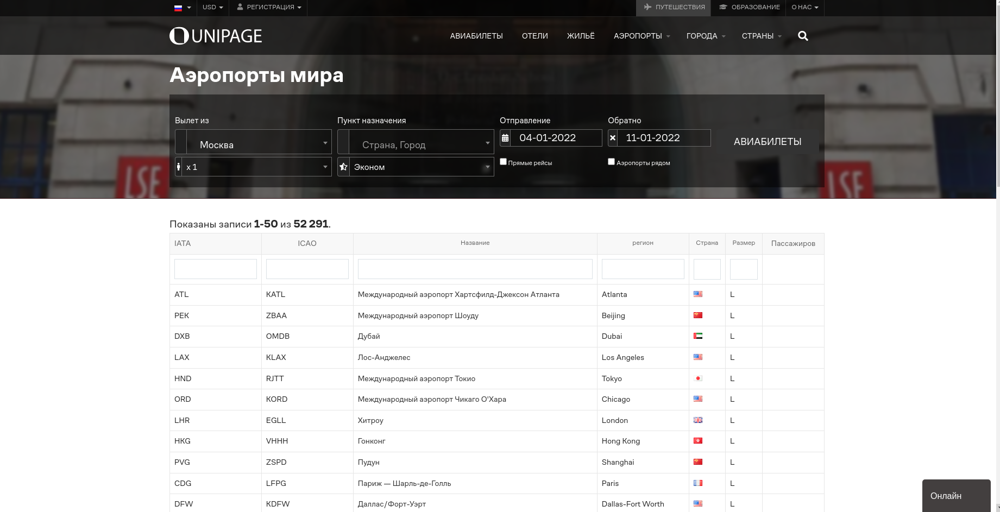

### Шаг 1: парсинг данных авиабилетов

1. Получаем список аэропортов
2. Получаем билеты для всех пар из списка полученных аэропортов

In [11]:
%env AVIASALES_TOKEN="YOUR TOKEN"

env: AVIASALES_TOKEN="YOUR TOKEN"


In [10]:
from parser.data_processor import get_tickets

df = get_tickets(num_airports=1000, 
                 airport_size=["M", "S"])

Parsing available airports...


  0%|                                                  | 0/3655 [00:00<?, ?it/s]

Parsing tickets...


100%|███████████████████████████████████████| 3655/3655 [20:05<00:00,  3.03it/s]

Total count for: 13316


In [16]:
df.head(3)

,origin,destination,price,airline,flight_number,departure_at,return_at,transfers,expires_at,datetime,origin_city,origin_country,destination_city,destination_country
0,MRV,VOG,94,UT,322,2021-12-05T16:35:00+03:00,2021-12-06T14:55:00+03:00,1,2021-12-06T18:21:59Z,2021-12-05,Mineralnyye Vody,Russia,Volgograd,Russia
1,MRV,VOG,77,A4,357,2021-12-06T13:45:00+03:00,2021-12-13T14:55:00+03:00,1,2021-12-06T18:21:59Z,2021-12-06,Mineralnyye Vody,Russia,Volgograd,Russia
2,MRV,VOG,82,DP,6916,2021-12-07T20:40:00+03:00,2021-12-10T14:55:00+03:00,1,2021-12-06T18:21:59Z,2021-12-07,Mineralnyye Vody,Russia,Volgograd,Russia


### Шаг 2: сбор дополнительных данных

Рассчитываем координаты полученных точек и расстояние между точками маршрута.

In [7]:
import numpy as np
import pandas as pd

from geopy.geocoders import Nominatim
from geopy import Point, distance

In [8]:
def create_point(row, key):
    if str(row[f'{key}_city_lat']) != 'nan':
        return Point(str(row[f'{key}_city_lat']) + ' ' + str(row[f'{key}_city_lon']))
    else:
        return row

In [9]:
def find_distance(x):
    try:
        return distance.distance(x['destination_point'], x['origin_point']).km
    except Exception:
        return np.nan

In [23]:
def process_city(cities_lat_dict, cities_lon_dict, cities_type_dict, cities_country_dict, not_found):
    location = geolocator.geocode(city)
    if location:
        location_dict = location.raw
        cities_lat_dict[city] = location_dict['lat']

        if city != 'Mineralnyye Vody':
            cities_lon_dict[city] = location_dict['lon']
        else:
            cities_lon_dict[city] = '43.0909294469511'

        cities_type_dict[city] = location_dict['type']
        cities_country_dict[city] = location_dict['display_name'].split(',')[-1]

    else:
        if city == 'Mys Kamennyi':
            cities_lat_dict[city] = '68.46629314772403'
            cities_lon_dict[city] = '73.59525608730465'
            cities_type_dict[city] = '?'
            cities_country_dict[city] = 'Россия'
        else:
            not_found.append(city)
            print(f"Not found city: {city}")

In [10]:
def add_location_metadata(df: pd.DataFrame):
    """
    Function extracts additional data on cities location and distance to dataframe.
    """
    geolocator = Nominatim(user_agent='andrew_v')

    all_cities = list(set(df['origin_city'].unique()) | set(df['destination_city'].unique()))
    cities_lat_dict, cities_lon_dict, cities_type_dict, cities_country_dict = {}, {}, {}, {}
    not_found = []
    for city in all_cities:
        process_city(cities_lat_dict, cities_lon_dict, cities_type_dict, cities_country_dict, not_found)

    df['origin_city_lat'] = df['origin_city'].map(cities_lat_dict)
    df['origin_city_lon'] = df['origin_city'].map(cities_lon_dict)
    df['origin_city_type'] = df['origin_city'].map(cities_type_dict)
    df['origin_city_country'] = df['origin_city'].map(cities_country_dict)
    df['destination_city_lat'] = df['destination_city'].map(cities_lat_dict)
    df['destination_city_lon'] = df['destination_city'].map(cities_lon_dict)
    df['destination_city_type'] = df['destination_city'].map(cities_type_dict)
    df['destination_city_country'] = df['destination_city'].map(cities_country_dict)
    df['destination_point'] = df.apply(lambda x: create_point(x, 'destination'),
                                       axis=1)
    df['origin_point'] = df.apply(lambda x: create_point(x, 'origin'),
                                  axis=1)
    df['distance_origin_destination_km'] = df.apply(lambda x: find_distance(x), axis=1)
    return df

In [47]:
import pandas as pd
df = pd.read_csv("data.csv")

In [48]:
df = add_location_metadata(df)

In [49]:
df.head(3)

,Unnamed: 0,origin,destination,price,airline,flight_number,departure_at,return_at,transfers,expires_at,...,origin_city_lon,origin_city_type,origin_city_country,destination_city_lat,destination_city_lon,destination_city_type,destination_city_country,destination_point,origin_point,distance_origin_destination_km
0,0,MRV,VOG,94,UT,322,2021-12-05T16:35:00+03:00,2021-12-06T14:55:00+03:00,1,2021-12-06T18:21:59Z,...,43.0909294469511,village,Россия,48.7081906,44.5153353,city,Россия,"48 42m 29.4862s N, 44 30m 55.2071s E","52 46m 1.47s N, 43 5m 27.346s E",462.558569
1,1,MRV,VOG,77,A4,357,2021-12-06T13:45:00+03:00,2021-12-13T14:55:00+03:00,1,2021-12-06T18:21:59Z,...,43.0909294469511,village,Россия,48.7081906,44.5153353,city,Россия,"48 42m 29.4862s N, 44 30m 55.2071s E","52 46m 1.47s N, 43 5m 27.346s E",462.558569
2,2,MRV,VOG,82,DP,6916,2021-12-07T20:40:00+03:00,2021-12-10T14:55:00+03:00,1,2021-12-06T18:21:59Z,...,43.0909294469511,village,Россия,48.7081906,44.5153353,city,Россия,"48 42m 29.4862s N, 44 30m 55.2071s E","52 46m 1.47s N, 43 5m 27.346s E",462.558569


## Первичный анализ данных

In [19]:
!pip install matplotlib
!pip install seaborn

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
Defaulting to user installation because normal site-packages is not writeable
  Using cached seaborn-0.11.2-py3-none-any.whl (292 kB)
     |████████████████████████████████| 25.9 MB 2.2 MB/s eta 0:00:01
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [20]:
import folium
import matplotlib.pyplot as plt
import seaborn as sns

In [50]:
def show_circles_on_map(data, latitude_column, longitude_column, color):
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    
    data: DataFrame that contains columns latitude_column and longitude_column
    latitude_column: string, the name of column for latitude coordinates
    longitude_column: string, the name of column for longitude coordinates
    color: string, the color of circles to be drawn
    """

    data[longitude_column] = data.apply(lambda x: float(x[longitude_column]), axis=1)
    data[latitude_column] = data.apply(lambda x: float(x[latitude_column]), axis=1)
    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location, zoom_start=5)

    for _, row in data.iterrows():
        folium.Circle(
            width='90%', height='90%',
            radius=100,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

In [51]:
# можно уменьшить карту и увидеть все точки отправления
show_circles_on_map(df, "origin_city_lat", "origin_city_lon", "blue")

## План на анализ:

1. Оценить объем записей по разным категориям:     
- Авиалинии
- Города отправления
- Даты 

2. Посмотреть распределения по:
- Динамике средних цен по дате
- Средним ценам по авиалиниям

## Необходимо к анализу:

- определить особенности выборки
- удалить выбросы (найти их)
- отметить дорогие полеты и дешевые полеты

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13316 entries, 0 to 13315
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   origin                          13316 non-null  object 
 1   destination                     13316 non-null  object 
 2   price                           13316 non-null  int64  
 3   airline                         13316 non-null  object 
 4   flight_number                   13316 non-null  int64  
 5   departure_at                    13316 non-null  object 
 6   return_at                       13316 non-null  object 
 7   transfers                       13316 non-null  int64  
 8   expires_at                      13316 non-null  object 
 9   datetime                        13316 non-null  object 
 10  origin_city                     13316 non-null  object 
 11  origin_country                  13316 non-null  object 
 12  destination_city                

**NULL'ов не обнаружено**

**Особенность выборки:** посмотреть на распределения и сделать вывода о выборке.

### Анализ городов отправления

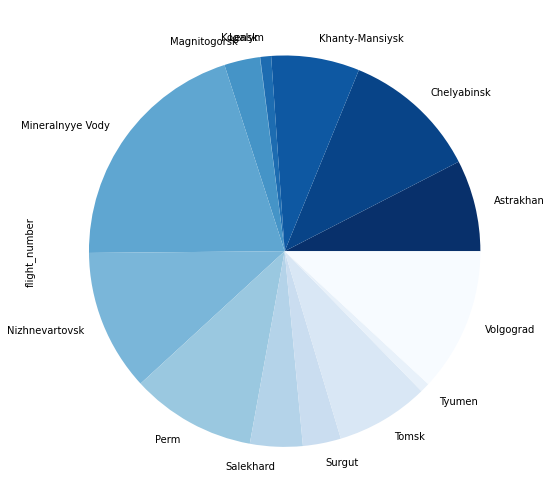

In [25]:
df.groupby(['origin_city'])['flight_number'].count().plot(kind='pie', figsize=(17,9), cmap="Blues_r")
plt.show()

In [26]:
print('Перечень всех городов из выборки:')
cities = df['origin_city'].unique()
cities = sorted(cities)
for city in cities:
    print(city)

Перечень всех городов из выборки:
Astrakhan
Chelyabinsk
Khanty-Mansiysk
Kogalym
Lensk
Magnitogorsk
Mineralnyye Vody
Nizhnevartovsk
Perm
Salekhard
Surgut
Tomsk
Tyumen
Volgograd


In [27]:
print(f'В нашей выборке содержится {df["origin_city"].nunique()} городов отправлений')

В нашей выборке содержится 14 городов отправлений


In [28]:
df.groupby(by='origin_city').flight_number.count()

origin_city
Astrakhan           1006
Chelyabinsk         1499
Khanty-Mansiysk      971
Kogalym              119
Lensk                  4
Magnitogorsk         393
Mineralnyye Vody    2685
Nizhnevartovsk      1556
Perm                1374
Salekhard            578
Surgut               419
Tomsk               1023
Tyumen               106
Volgograd           1583
Name: flight_number, dtype: int64

In [29]:
new_df = df.pivot_table(index='origin_city', values='flight_number', aggfunc='count')
new_df = new_df.rename(columns={"flight_number": "flight_counts",})
new_df['flights_percent'] = new_df['flight_counts'] / new_df['flight_counts'].sum() * 100
new_df

,flight_counts,flights_percent
origin_city,,
Astrakhan,1006,7.554821
Chelyabinsk,1499,11.257134
Khanty-Mansiysk,971,7.291980
Kogalym,119,0.893662
Lensk,4,0.030039
Magnitogorsk,393,2.951337
Mineralnyye Vody,2685,20.163713
Nizhnevartovsk,1556,11.685191
Perm,1374,10.318414


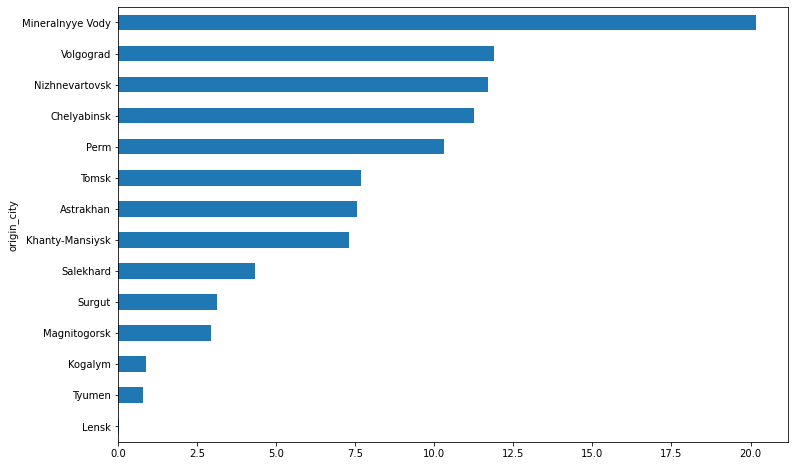

In [30]:
new_df['flights_percent'].sort_values().plot(kind='barh', figsize=(12,8))
plt.show()

### Анализ авиалиний

In [31]:
print(f'В нашей выборке содержится {df["airline"].nunique()} авиалинии')

В нашей выборке содержится 24 авиалинии


In [32]:
new_df = df.pivot_table(index='airline', values='flight_number', aggfunc='count')
new_df = new_df.rename(columns={"flight_number": "flight_counts",})
new_df['flights_percent'] = new_df['flight_counts'] / new_df['flight_counts'].sum() * 100

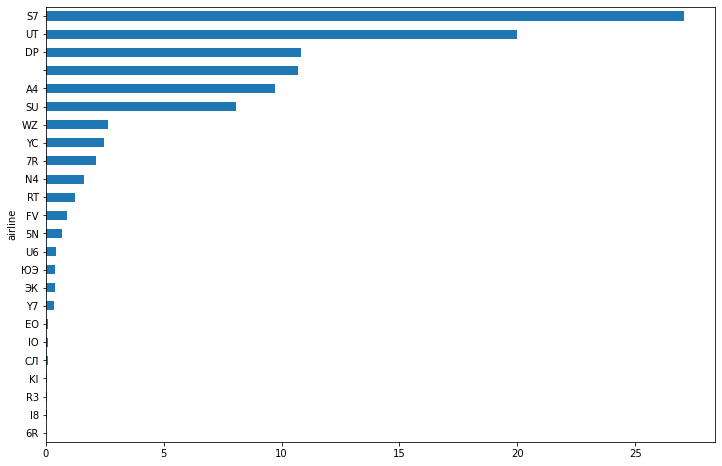

In [33]:
new_df['flights_percent'].sort_values().plot(kind='barh', figsize=(12,8))
plt.show()

- Авиалинии с наименьшим кол-вом отправлений

In [34]:
new_df.sort_values(by='flights_percent').head()

,flight_counts,flights_percent
airline,,
6R,2,0.015020
I8,5,0.037549
R3,5,0.037549
KI,7,0.052568
СЛ,11,0.082607


- Авиалинии с наибольшим кол-вом отправлений

In [35]:
new_df.sort_values(by='flights_percent', ascending=False).head()

,flight_counts,flights_percent
airline,,
S7,3602,27.050165
UT,2660,19.975969
DP,1444,10.844097
,1422,10.678883
A4,1295,9.725143


### Анализ дат отправления

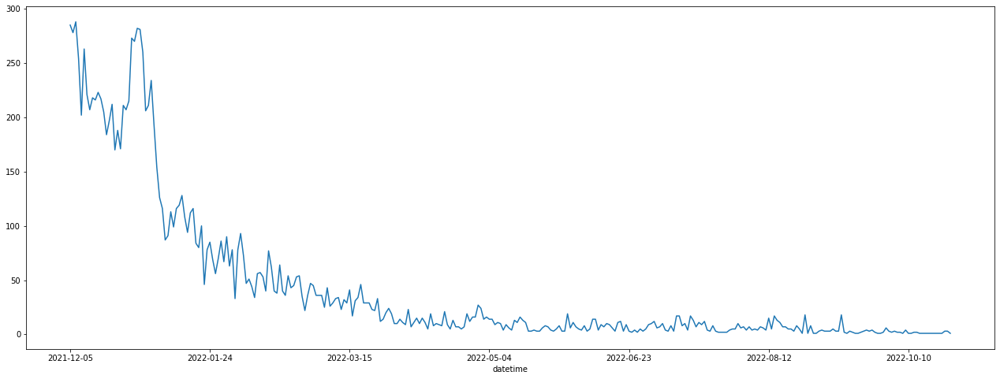

In [36]:
new_df = df.groupby(by='datetime').flight_number.count()
new_df.plot(kind='line', figsize=(22,8))
plt.show()

- После нового года происходит сильное падение по вылетам, которое в конечном итоге приближается к нулю

In [37]:
new_df = df.pivot_table(index='datetime', values='flight_number', aggfunc='count')
new_df = new_df.rename(columns={"flight_number": "flight_counts",})

Создадим список дней для проверки пропусков полетов по дням и посмотрим, что получилось

In [41]:
import datetime
import pandas as pd


dates = []
d = datetime.date(2021,11,29)
while d <= datetime.date(2022,11,12):
    dates.append(datetime.datetime.strftime(d,'%Y-%m-%d'))
    d += datetime.timedelta(days=1)

In [42]:
dates = pd.DataFrame(data=dates)
dates.columns = ['Dates']
dates.set_index('Dates',inplace=True)

In [43]:
df_dates = dates.join(new_df)
df_dates = df_dates.fillna(0)

In [44]:
x = df_dates[df_dates["flight_counts"] == 0].flight_counts.count()
print(f'В выборке {x} дней с нулевым кол-вом вылетов')

В выборке 35 дней с нулевым кол-вом вылетов


In [45]:
x = df_dates[df_dates["flight_counts"] <= 5].flight_counts.count()
print(f'В выборке {x} дней с 5 или менее количеством вылетов')

В выборке 136 дней с 5 или менее количеством вылетов


### Анализ метрик

из имеющихся данных мы имеем две метрики: цена, расстояние/цена (км-руб).

In [46]:
df['price_for_km'] = df['price'] / df['distance_origin_destination_km']

In [47]:
print(f'Среднее значение цены за км = {df["price_for_km"].mean()}')
print(f'Среднее значение цены за полет = {df["price"].mean()}')
print(f'Среднее значение расстояния за полет = {df["distance_origin_destination_km"].mean()}')

Среднее значение цены за км = 0.24752118782563476
Среднее значение цены за полет = 219.69885851607089
Среднее значение расстояния за полет = 1178.1884727385436


In [48]:
new_df = pd.DataFrame(data=df, columns=['airline', 'price', 'distance_origin_destination_km', 'price_for_km'])
new_df.groupby('airline').mean().head()

,price,distance_origin_destination_km,price_for_km
airline,,,
,227.474684,1211.659188,0.235518
5N,282.402174,1108.253352,0.260268
6R,287.000000,1510.584524,0.189993
7R,201.220280,533.694755,0.429819
A4,131.166795,1324.359477,0.108437


Уже по средним можно увидеть что некоторые авиалинии значительно отличаются по ценам (в большую и меньшую сторону)

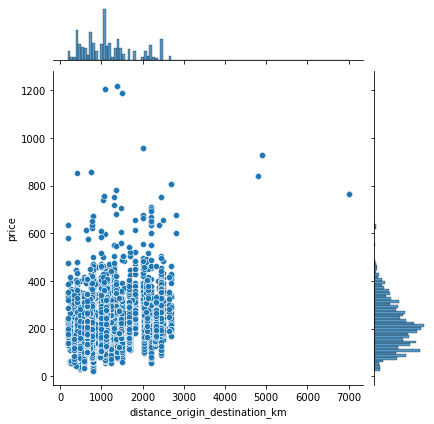

In [49]:
sns.jointplot(
    x='distance_origin_destination_km',
    y='price',
    data=new_df,
    kind='scatter' 
)
plt.show()

In [50]:
df_cut = new_df[new_df['distance_origin_destination_km'] <= 3000]
df_cut = df_cut[df_cut['price'] <= 1000]

Также видны точки которые выбиваются из общей выборки. Ограничимся расстоянием до 3к км.

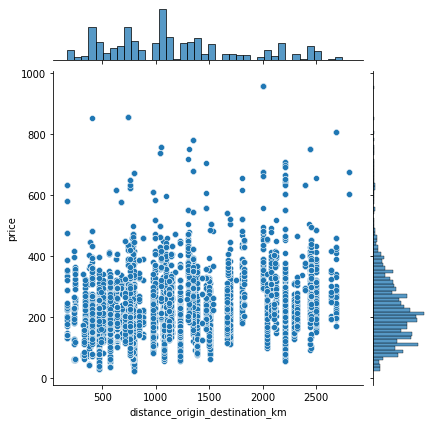

In [51]:
sns.jointplot(
    x='distance_origin_destination_km',
    y='price',
    data=df_cut,
    kind='scatter'
)
plt.show()

Проверим цену и расстояние на нормальность

In [52]:
from scipy.stats import normaltest

In [53]:
stat, pvalue = normaltest(df_cut['price'])
pvalue

0.0

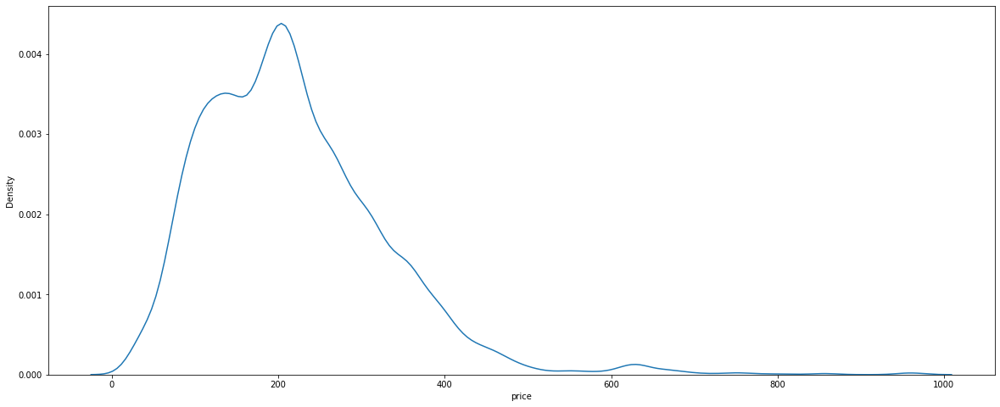

In [54]:
sns_plot = sns.kdeplot(df_cut['price'])
fig = sns_plot.get_figure()
fig.set_figheight(8)
fig.set_figwidth(20)

In [55]:
stat, pvalue = normaltest(df_cut['distance_origin_destination_km'])
pvalue

4.4218800878941475e-206

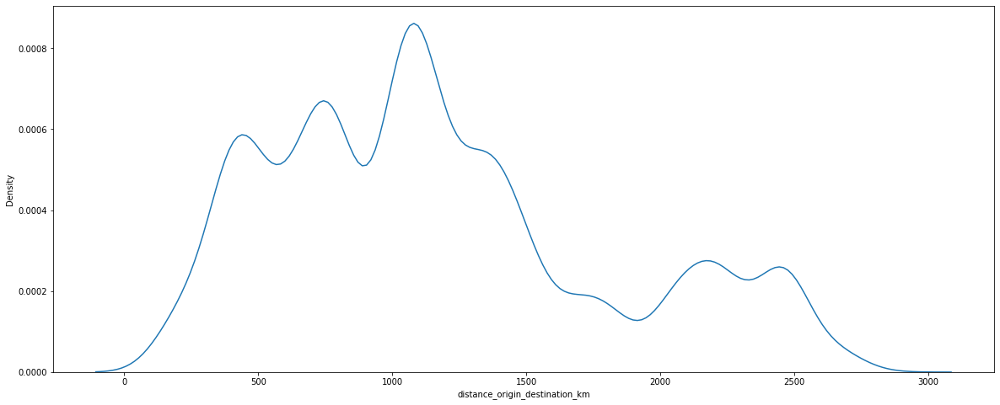

In [56]:
sns_plot = sns.kdeplot(df_cut['distance_origin_destination_km'])
fig = sns_plot.get_figure()
fig.set_figheight(8)
fig.set_figwidth(20)

In [57]:
stat, p = normaltest(df_cut['price_for_km'])
p

0.0

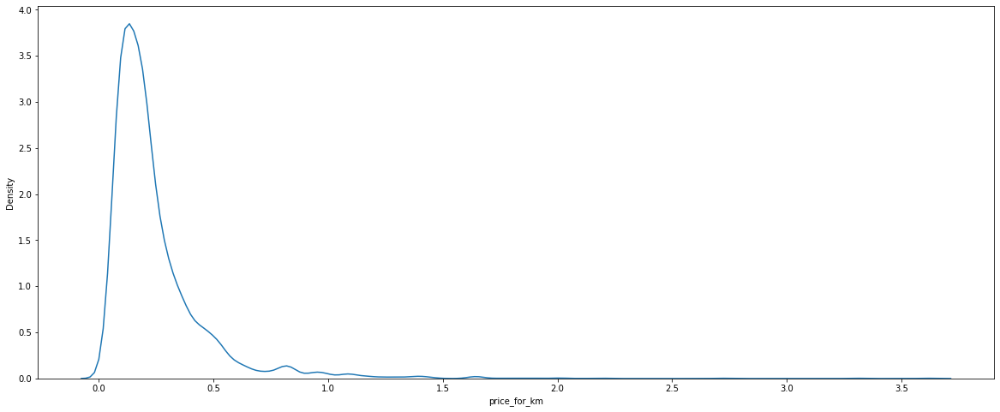

In [58]:
sns_plot = sns.kdeplot(df_cut['price_for_km'])
fig = sns_plot.get_figure()
fig.set_figheight(8)
fig.set_figwidth(20)

Так как основная гипотеза в тесте на нормальность состоит в предположении, что данные нормальны, а мы имеем нулевое (или около нулевое) значение p-value, то основная гипотеза отвергается (p-value меньше любого разумного уровня значимости), следовательно, данные <b>не</b> являются нормально распределенными.

Выведем распределение по ТОП-10 авиалиниям по кол-ву поездок

In [59]:
top = df_cut.groupby('airline').price.count().nlargest(10)
top = pd.DataFrame(data = top)
top = top.reset_index()
top = list(top['airline'])
top = df_cut[df_cut['airline'].isin(top)]

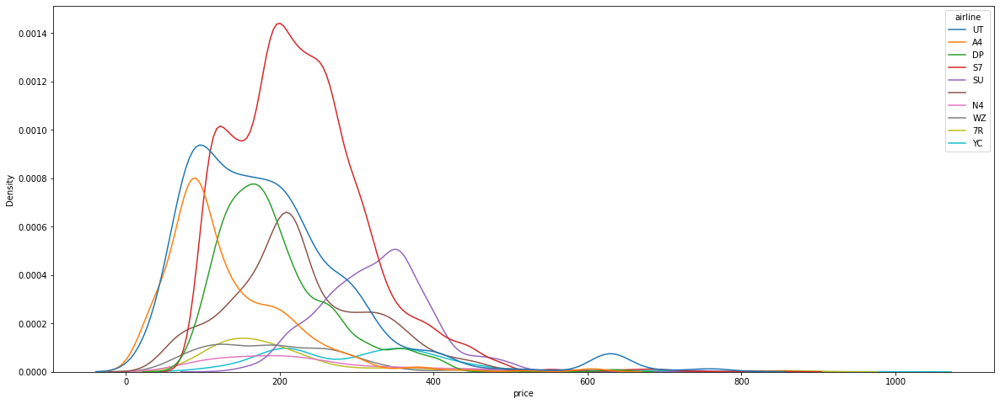

In [60]:
sns_plot = sns.kdeplot(data=top, x='price', hue='airline')
fig = sns_plot.get_figure()
fig.set_figheight(8)
fig.set_figwidth(20)

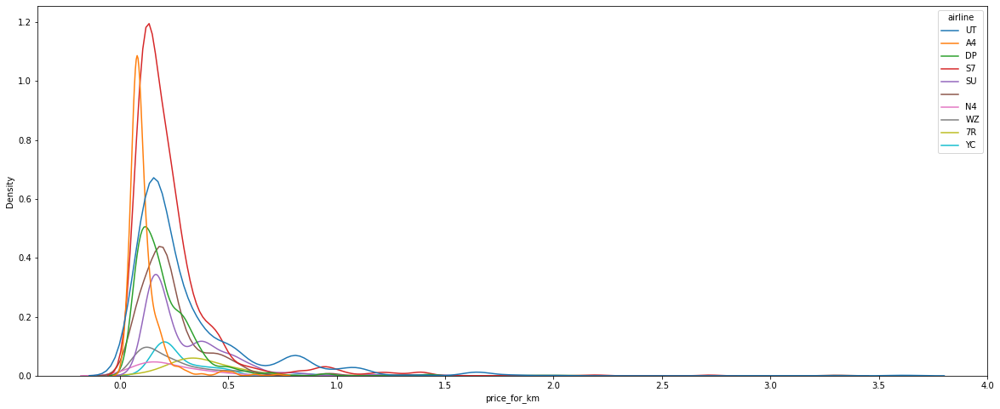

In [61]:
sns_plot = sns.kdeplot(data=top, x='price_for_km', hue='airline')
fig = sns_plot.get_figure()
fig.set_figheight(8)
fig.set_figwidth(20)

После визуального анализа возникла гипотеза, что существуют авиалинии которые дороже остальных, не зависимо от дальности. Например на графике выше видно, что Utair(UT) дороже Аэрофлота (A4)

In [62]:
!pip install pingouin

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 182 kB 1.9 MB/s eta 0:00:01
     |████████████████████████████████| 9.9 MB 2.3 MB/s eta 0:00:01
     |████████████████████████████████| 835 kB 2.3 MB/s eta 0:00:01
     |████████████████████████████████| 233 kB 3.0 MB/s eta 0:00:01
  Created wheel for pingouin: filename=pingouin-0.5.0-py3-none-any.whl size=182505 sha256=9e21365e4af3f84059b6b850f279ce5bfa22268533d2e6a648c3584d1ec45a3a
  Stored in directory: /home/e-phobia/.cache/pip/wheels/61/fe/b5/340c9d5290780d6eafcf38988adbb46f82df2301ef7a0996ea
  Created wheel for littleutils: filename=littleutils-0.2.2-py3-none-any.whl size=7771 sha256=f13de98e89f8b1fc1617949469b20c14a7ff50dddc4d5c1ca253baf0dac065b2
  Stored in directory: /home/e-phobia/.cache/pip/wheels/6a/33/c4/0ef84d7f5568c2823e3d63a6e08988852fb9e4bc822034870a
Successfully built pingouin littleutils
You should consider upgrading via the '/usr/bin/python3 -m pip i

In [63]:
import pingouin as pn

### Гипотеза 1: 
цена на перелет зависит от авиалинии, существуют дорогие авиалинии и их более дешевые аналоги. 

In [27]:
df_A4 = df_cut[df_cut['airline'] == 'A4'].price_for_km
df_UT = df_cut[df_cut['airline'] == 'UT'].price_for_km

In [65]:
pn.ttest(df_UT,df_A4)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,31.528207,3309.504411,two-sided,5.191541e-191,"[0.19, 0.21]",0.78216,4.584e+190,1.0


Гипотеза подтвердилась, UT дороже чем A4. Alpha = 0,05 выше чем p-val, а также 0 не находится в доверительном интервале

### Гипотеза 2: 
некоторые авиалинии специализируются только на длительные перелеты, поэтому у них завышена цена. Проверим на аналогичном примере с UT и A4

In [66]:
df_A4 = df_cut[df_cut['airline'] == 'A4'].distance_origin_destination_km
df_UT = df_cut[df_cut['airline'] == 'UT'].distance_origin_destination_km

In [67]:
pn.ttest(df_UT,df_A4)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-22.836301,2439.246415,two-sided,9.104671e-105,"[-496.31, -417.81]",0.789051,4.345e+104,1.0


Гипотеза подтвердилась, похоже что UT специализируется на коротких перелетах, в отличие от A4. Но у A4 они все равно выгоднее.

### Резюме

В работе были проверены гипотезы:  
- Распределение цены перелетов по выборке является нормальным - опровержена критерием Андерсона-Дарлинг
- Распределение цены за км по выборке является нормальным - опровержена критерием Андерсона-Дарлинг
- Распределение расстояние перелетов по выборке является нормальным - опровержена критерием Андерсона-Дарлинг
- Существуют неоправдано дорогие авиакомпании - подтвердилась с помощью Т-критерия Стьюдента 

## Aлгоритм поиска кратчайшего пути

Алгоритм нацелен на поиск оптимального по стоимости маршрута между двумя заданными городами. Поскольку из датасета исключены крупные города, не между каждым есть прямое сообщение, а если и есть - оно не всегда наиболее оптимальное.
Основано на алгоритме Дейкстры. Граф содержит города в качестве вершин, в качестве ребер - маршруты между ними, в качестве весов - минимальные цены маршрутов. На вход подаются две вершины, на выходе - построенный оптимальный путь между ними. В результате работы алгоритма пользователь получит маршрут и его стоимость.

Основная директория алгоритма: `path_finder`
- `show_optimal_route.py` - исполняемый файл алгоритма
- `test_path_finding.py` - тесты

### Использование

In [36]:
! python3 path_finder/show_optimal_route.py --help

usage: show_optimal_route.py [-h] [--origin ORIGIN]
                             [--destination DESTINATION]

optional arguments:
  -h, --help            show this help message and exit
  --origin ORIGIN, -o ORIGIN
                        Origin city
  --destination DESTINATION, -d DESTINATION
                        Destination city


In [31]:
! python3 path_finder/show_optimal_route.py -o Tyumen -d Lensk

Price: 675, route: Tyumen->Lensk


In [32]:
! python3 path_finder/show_optimal_route.py -o Volgograd -d Salekhard

Price: 283, route: Volgograd->Chelyabinsk->Salekhard


## Заключительный обзор результатов применения алгоритма поиска кратчайшего пути


Создадим датасет с кратчайшими маршрутами между каждыми двумя городами и ценами на такой перелет


In [13]:
from itertools import permutations
import numpy as np
import pandas as pd
from path_finder.algorithm import PathFinder

df = pd.DataFrame(columns=["origin", "destination", "price", "path"])
df['origin'] = df['origin'].astype('string')
df['destination'] = df['destination'].astype('string')
df['price'] = df['price'].astype('Int64')


pf = PathFinder('data/data.csv', 'cp1251')
all_cities = set(pf.df[pf.origin_field]) | set(pf.df[pf.destination_field])
for i, city_pair in enumerate(permutations(all_cities, 2)):
    city_1, city_2 = city_pair
    path = pf.find_path(city_1, city_2)
    if path:
        df.loc[i] = [city_1, city_2, path.price, [city.capitalize() for city in path.stages]]

df.head()

,origin,destination,price,path
24,Magnitogorsk,Mys Kamennyi,525,"[Magnitogorsk, Chelyabinsk, Salekhard, Mys kam..."
25,Magnitogorsk,Ust-Ilimsk,574,"[Magnitogorsk, Mineralnyye vody, Ust-ilimsk]"
26,Magnitogorsk,Tyumen,184,"[Magnitogorsk, Tyumen]"
27,Magnitogorsk,Perm,175,"[Magnitogorsk, Perm]"
29,Magnitogorsk,Kostroma,395,"[Magnitogorsk, Chelyabinsk, Kostroma]"


Посмотрим на колонку с ценами


<AxesSubplot:>

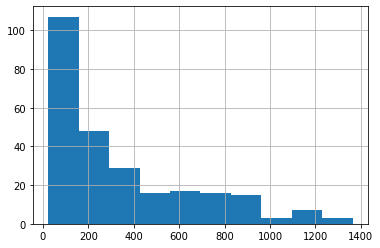

In [14]:
df.price.hist()

In [15]:
df[df.price == df.price.min()]

,origin,destination,price,path
401,Mineralnyye Vody,Astrakhan,24,"[Mineralnyye vody, Astrakhan]"
448,Astrakhan,Mineralnyye Vody,24,"[Astrakhan, Mineralnyye vody]"


In [16]:
df[df.price == df.price.max()]

,origin,destination,price,path
427,Salekhard,Deputatskiy,1364,"[Salekhard, Perm, Tomsk, Deputatskiy]"


In [17]:
df.price.astype("float64").describe()

count     261.000000
mean      346.586207
std       311.240269
min        24.000000
25%       120.000000
50%       203.000000
75%       499.000000
max      1364.000000
Name: price, dtype: float64

Видим, что самый дешевый оптимальный маршрут будет из Астрахани в Минеральные воды, а вот из Салехарда до Депутатского добраться дешево точно не выйдет. Видно, что цены распределены очень неравномерно - дешевых маршрутов много, а дорогих мало, что в целом кажется логичным.

Давайте посмотрим, как часто между городами существует маршрут более оптимальный по цене, чем прямой

In [18]:
paths_map = pf.get_paths_map()


def get_direct_price(row):
    origin = row.origin.lower()
    destination = row.destination.lower()
    if origin in paths_map:
        if destination in paths_map[origin]:
            row['direct'] = paths_map[origin][destination]
    return row

df['direct'] = 0
df = df.apply(get_direct_price, axis=1)
df[df.price < df.direct].shape[0]/df.shape[0]

0.22988505747126436

Видно, что это не такое уж редкое явление - в 23% случаях при наличии между двумя городами прямого рейса существует более дешевый маршрут. Давайте глянем примеры, где эта разница особенно сильно видна.


In [41]:
df['price_diff'] = 0


def set_price_diff(row):
    if row.direct:
        row.price_diff = row.direct - row.price
    return row

df = df.apply(set_price_diff, axis=1)
df.sort_values('price_diff', ascending=False)[:15]

,origin,destination,price,path,direct,price_diff
331,Kogalym,Perm,201,"[Kogalym, Khanty-mansiysk, Chelyabinsk, Perm]",757,556
117,Salekhard,Nizhnevartovsk,303,"[Salekhard, Chelyabinsk, Mineralnyye vody, Niz...",672,369
324,Kogalym,Astrakhan,172,"[Kogalym, Mineralnyye vody, Astrakhan]",505,333
358,Magnitogorsk,Khanty-Mansiysk,256,"[Magnitogorsk, Mineralnyye vody, Nizhnevartovs...",462,206
115,Salekhard,Astrakhan,271,"[Salekhard, Chelyabinsk, Mineralnyye vody, Ast...",434,163
263,Chelyabinsk,Kogalym,132,"[Chelyabinsk, Khanty-mansiysk, Kogalym]",283,151
305,Khanty-Mansiysk,Astrakhan,126,"[Khanty-mansiysk, Chelyabinsk, Mineralnyye vod...",251,125
334,Kogalym,Ulyanovsk,197,"[Kogalym, Khanty-mansiysk, Ulyanovsk]",322,125
139,Volgograd,Salekhard,283,"[Volgograd, Chelyabinsk, Salekhard]",400,117
21,Astrakhan,Nizhnevartovsk,80,"[Astrakhan, Mineralnyye vody, Nizhnevartovsk]",194,114


Почему-то бросается в глаза то, что во всех рейсах фигурируют города ХМАО и ЯНАО.

Ну и в заключение давайте посмотрим, через аэропорты каких городов бывает выгоднее летать - посчитаем все рейсы, где обходной рейс дешевле прямого и посмотрим, через какие промежуточные города проходил маршрут.


In [42]:
from collections import defaultdict
import matplotlib.pyplot as plt

city_profitable_routes = defaultdict(int)
for _, row in df[df.price_diff > 0].iterrows():
    for city in row['path'][1:-1]:
        city_profitable_routes[city] += 1

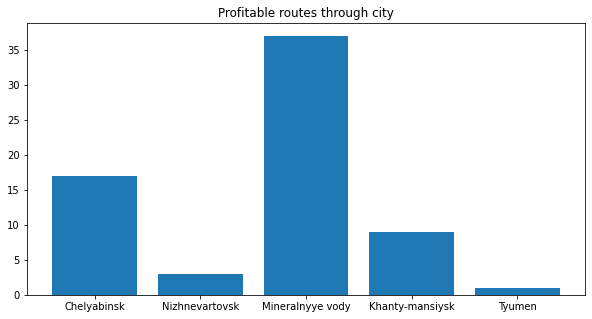

In [44]:
plt.figure(figsize=(10, 5))
plt.bar(city_profitable_routes.keys(), city_profitable_routes.values())
plt.title("Profitable routes through city");

В общем-то интуитивно понятный результат, если сверить их с данными по самым загруженным аэропортам России - https://ru.wikipedia.org/wiki/%D0%A1%D0%BF%D0%B8%D1%81%D0%BE%D0%BA_%D0%BD%D0%B0%D0%B8%D0%B1%D0%BE%D0%BB%D0%B5%D0%B5_%D0%B7%D0%B0%D0%B3%D1%80%D1%83%D0%B6%D0%B5%D0%BD%D0%BD%D1%8B%D1%85_%D0%B0%D1%8D%D1%80%D0%BE%D0%BF%D0%BE%D1%80%D1%82%D0%BE%D0%B2_%D0%A0%D0%BE%D1%81%D1%81%D0%B8%D0%B8#2020_%D0%B3%D0%BE%D0%B4

Часто лететь c пересадкой через оживленный аэропорт выгоднее, чем напрямую из менее оживленного. Единственная "аномалия" - аэропорт Ханты-Мансийска, он не такой оживленный, но через него много выгодных рейсов. Давайте под конец поймем, в чем тут может быть дело.

In [22]:
tmp = df[(df.price_diff > 0) & (df.origin != 'Khanty-Mansiysk') & (df.destination != 'Khanty-Mansiysk')]
index = [('khanty-mansiysk' in map(lambda s: s.lower(), x)) for x in tmp['path']]
tmp[index]

,origin,destination,price,path,direct,price_diff
258,Chelyabinsk,Uray,123,"[Chelyabinsk, Khanty-mansiysk, Uray]",257,134
262,Chelyabinsk,Kogalym,131,"[Chelyabinsk, Khanty-mansiysk, Kogalym]",237,106
346,Nizhnevartovsk,Chelyabinsk,133,"[Nizhnevartovsk, Khanty-mansiysk, Chelyabinsk]",167,34
348,Nizhnevartovsk,Surgut,129,"[Nizhnevartovsk, Khanty-mansiysk, Surgut]",138,9
354,Nizhnevartovsk,Uray,134,"[Nizhnevartovsk, Khanty-mansiysk, Uray]",212,78
406,Mineralnyye Vody,Kogalym,208,"[Mineralnyye vody, Nizhnevartovsk, Khanty-mans...",215,7
550,Tomsk,Kogalym,223,"[Tomsk, Khanty-mansiysk, Kogalym]",263,40
555,Kogalym,Tyumen,142,"[Kogalym, Khanty-mansiysk, Tyumen]",151,9
562,Kogalym,Chelyabinsk,133,"[Kogalym, Khanty-mansiysk, Chelyabinsk]",270,137


Ну, так как все такие рейсы - это рейсы либо в ХМАО, либо из ХМАО, то судя по всему наша аномалия связана с тем, что у нас в выборке непропорционально много городов из ХМАО, а Ханты-Мансийск столица округа и через нее летать в пределах региона часто бывает выгоднее.

In [23]:
all_cities

{'Astrakhan',
 'Bodaybo',
 'Chelyabinsk',
 'Deputatskiy',
 'Khanty-Mansiysk',
 'Kogalym',
 'Kostroma',
 'Kurilsk',
 'Lensk',
 'Magnitogorsk',
 'Mineralnyye Vody',
 'Mys Kamennyi',
 'Nizhnevartovsk',
 'Okha',
 'Perm',
 'Salekhard',
 'Sovetskaya Gavan',
 'Strezhevoy',
 'Surgut',
 'Tomsk',
 'Tyumen',
 'Ulyanovsk',
 'Uray',
 'Ust-Ilimsk',
 'Volgograd'}

Да, так и есть - 6 из 25 городов у нас в ХМАО, это все объясняет.

# Спасибо за внимание!

In [15]:
df.shape

(13316, 14)